In [1]:
## Installing library

!pip install quickda

In [2]:
## Importing libraries

import pandas as pd
import numpy as np

from quickda.explore_data import *
from quickda.explore_numeric import *
from quickda.explore_categoric import *
from quickda.explore_numeric_categoric import *

Pandas backend loaded 1.3.4
Numpy backend loaded 1.20.3
Pyspark backend NOT loaded
Python backend loaded


In [3]:
## Setting rows and column display setting

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [4]:
## Loading Data

# Data URL from UCI repository
auto_data_url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/autos/imports-85.data'

# List of columns
column_names = ['symboling', 'normalized-losses', 'make', 'fuel-type', 'aspiration', 'num-of-doors', 'body-style', 
                'drive-wheels', 'engine-location', 'wheel-base', 'length', 'width', 'height', 'curb-weight', 
                'engine-type', 'num-of-cylinders', 'engine-size', 'fuel-system', 'bore', 'stroke', 'compression-ratio', 
                'horsepower', 'peak-rpm', 'city-mpg', 'highway-mpg', 'price']

# Reading data as pandas dataframe
df = pd.read_csv(auto_data_url, names=column_names)
df = df.replace({'?': np.nan})

In [5]:
## Converting columns to Numeric type
numeric_cols = ['normalized-losses', 'engine-size', 'horsepower', 'peak-rpm', 'bore', 'stroke', 'price']
df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors='coerce', axis=1)

In [6]:
## Summarising the Dataset (describing each feature and the measures of central tendencies)

explore(df, method="summarize")

C:\Users\ashish.kamboj\Anaconda3\lib\site-packages\quickda\explore_data.py:26: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

C:\Users\ashish.kamboj\Anaconda3\lib\site-packages\quickda\explore_data.py:30: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



,dtypes,count,null_sum,null_pct,nunique,min,25%,50%,75%,max,mean,median,std,skew
aspiration,object,205,0,0.00,2,std,-,-,-,turbo,-,-,-,-
body-style,object,205,0,0.00,5,convertible,-,-,-,wagon,-,-,-,-
bore,float64,201,4,0.02,38,2.54,3.15,3.31,3.59,3.94,3.329751,3.31,0.273539,0.020016
city-mpg,int64,205,0,0.00,29,13,19.0,24.0,30.0,49,25.219512,24.0,6.542142,0.663704
compression-ratio,float64,205,0,0.00,32,7.0,8.6,9.0,9.4,23.0,10.142537,9.0,3.97204,2.610862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
price,float64,201,4,0.02,186,5118.0,7775.0,10295.0,16500.0,45400.0,13207.129353,10295.0,7947.066342,1.809675
stroke,float64,201,4,0.02,36,2.07,3.11,3.29,3.41,4.17,3.255423,3.29,0.316717,-0.683122
symboling,int64,205,0,0.00,6,-2,0.0,1.0,2.0,3,0.834146,1.0,1.245307,0.211072
wheel-base,float64,205,0,0.00,53,86.6,94.5,97.0,102.4,120.9,98.756585,97.0,6.021776,1.050214


In [7]:
## Dataset Profiling (generates HML profile of Overview, Warnings, Variables, Interactions, Correlations and Missing Values)
## This uses the Pandas-Profiling package to profile the dataset

explore(df, 
        method="profile", 
        report_name="Dataset Report", 
        is_large_dataset=False)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Outlier Analysis - Boxplot


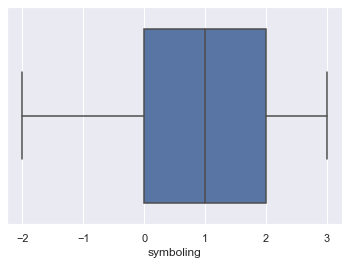

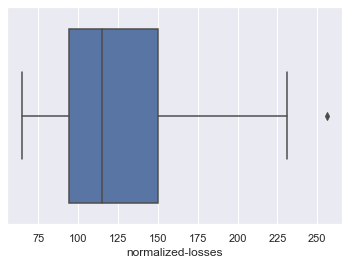

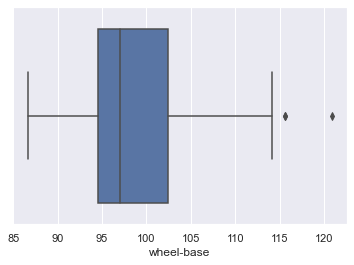

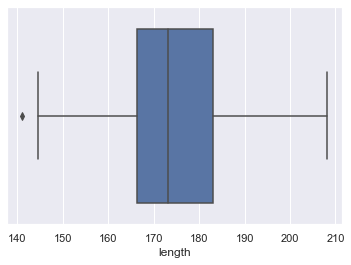

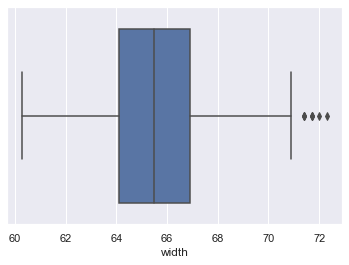

...

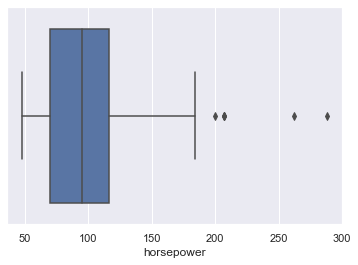

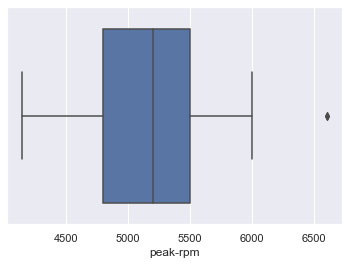

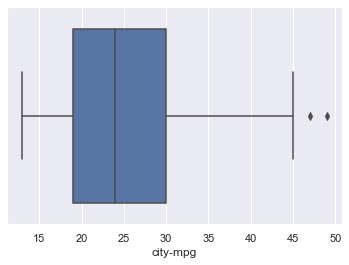

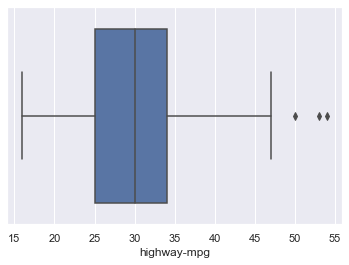

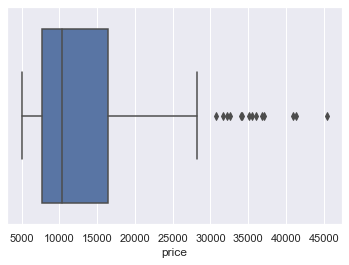

Distribution Analysis - Histogram


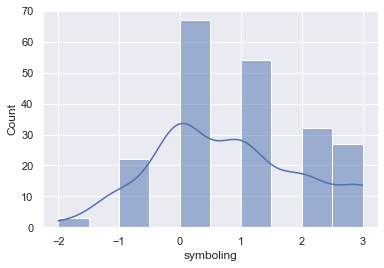

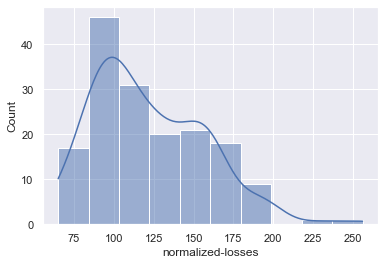

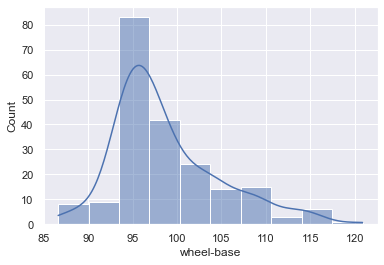

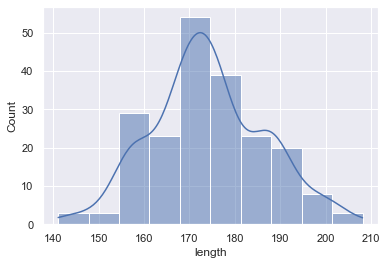

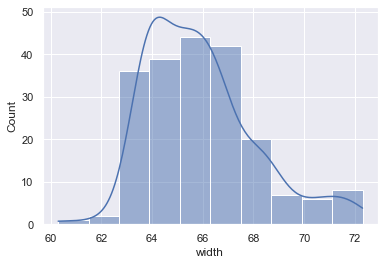

...

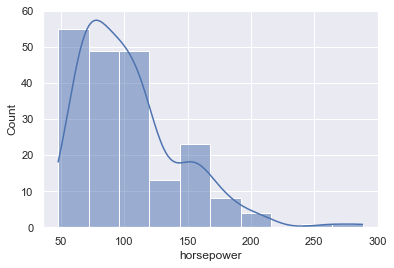

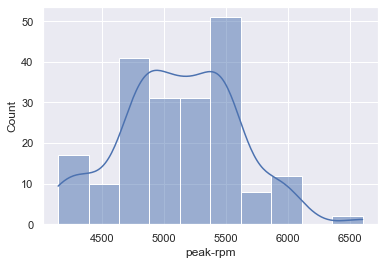

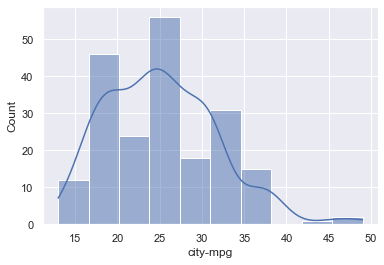

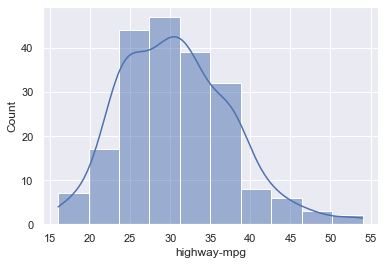

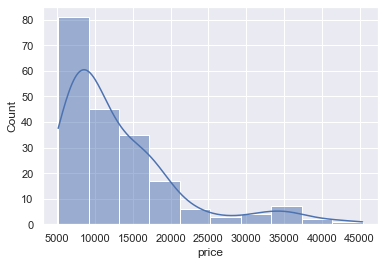

In [8]:
## Exploring Numeric Features (generates histogram and boxplots of all numeric columns in the dataset)

eda_num(df, method="default", bins=10)

In [9]:
## Generate correlation matrix

eda_num(df, method="correlation")

Correlation Analysis - Heatmap


C:\Users\ashish.kamboj\Anaconda3\lib\site-packages\quickda\explore_numeric.py:30: FutureWarning:

this method is deprecated in favour of `Styler.format(precision=..)`



,symboling,normalized-losses,wheel-base,length,width,height,curb-weight,engine-size,bore,stroke,compression-ratio,horsepower,peak-rpm,city-mpg,highway-mpg,price
symboling,1.00,0.53,-0.53,-0.36,-0.23,-0.54,-0.23,-0.11,-0.13,-0.01,-0.18,0.07,0.27,-0.04,0.03,-0.08
normalized-losses,0.53,1.00,-0.07,0.02,0.11,-0.43,0.12,0.17,-0.04,0.07,-0.13,0.30,0.26,-0.26,-0.21,0.20
wheel-base,-0.53,-0.07,1.00,0.87,0.80,0.59,0.78,0.57,0.49,0.16,0.25,0.35,-0.36,-0.47,-0.54,0.58
length,-0.36,0.02,0.87,1.00,0.84,0.49,0.88,0.68,0.61,0.13,0.16,0.56,-0.29,-0.67,-0.70,0.69
width,-0.23,0.11,0.80,0.84,1.00,0.28,0.87,0.74,0.56,0.18,0.18,0.64,-0.22,-0.64,-0.68,0.75
height,-0.54,-0.43,0.59,0.49,0.28,1.00,0.30,0.07,0.18,-0.06,0.26,-0.11,-0.32,-0.05,-0.11,0.14
curb-weight,-0.23,0.12,0.78,0.88,0.87,0.30,1.00,0.85,0.65,0.17,0.15,0.75,-0.27,-0.76,-0.80,0.83
engine-size,-0.11,0.17,0.57,0.68,0.74,0.07,0.85,1.00,0.59,0.21,0.03,0.81,-0.24,-0.65,-0.68,0.87
bore,-0.13,-0.04,0.49,0.61,0.56,0.18,0.65,0.59,1.00,-0.06,0.01,0.58,-0.26,-0.59,-0.59,0.54
stroke,-0.01,0.07,0.16,0.13,0.18,-0.06,0.17,0.21,-0.06,1.00,0.19,0.09,-0.07,-0.04,-0.04,0.08


Bar Plot of body-style


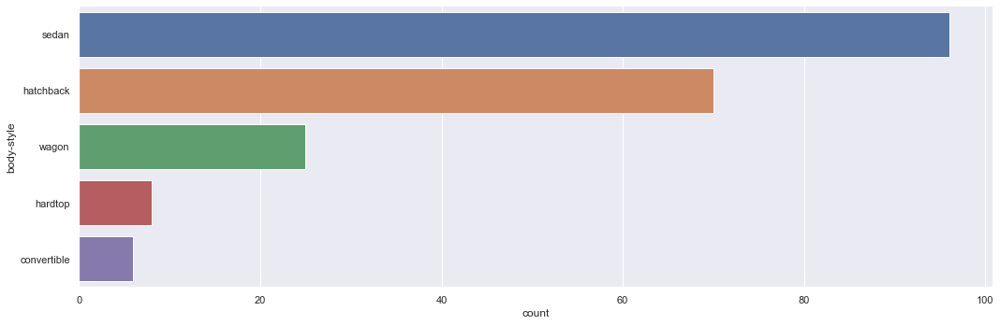

Summary of body-style


,count,relative_pct
sedan,96,0.47
hatchback,70,0.34
wagon,25,0.12
hardtop,8,0.04
convertible,6,0.03


In [10]:
## Exploring Categorical Feature (Distribution of single categorical feature)

eda_cat(df, x="body-style", y=None, method="default")

Bar Plot of body-style with respect to engine-type


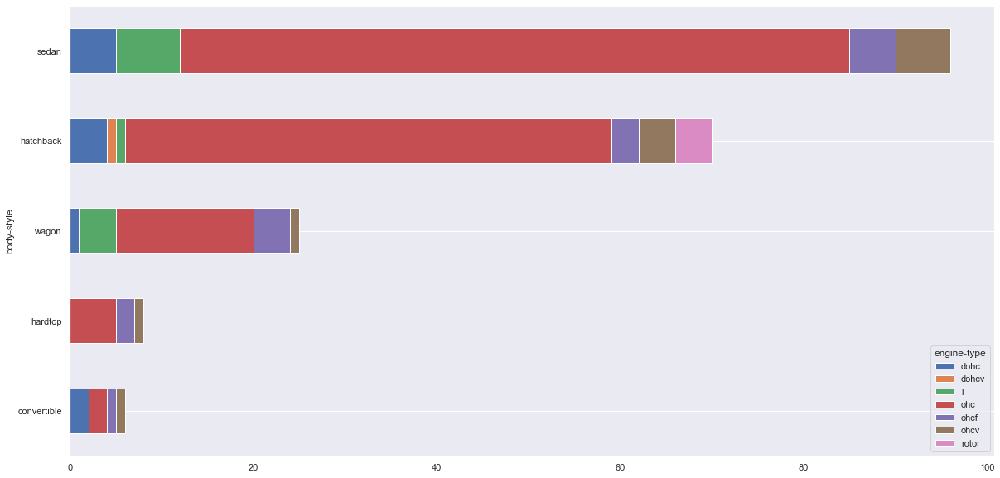

Crosstabulation of body-style across engine-type


engine-type,dohc,dohcv,l,ohc,ohcf,ohcv,rotor
body-style,,,,,,,
sedan,0.05,0.00,0.07,0.76,0.05,0.06,0.00
hatchback,0.06,0.01,0.01,0.76,0.04,0.06,0.06
wagon,0.04,0.00,0.16,0.60,0.16,0.04,0.00
hardtop,0.00,0.00,0.00,0.62,0.25,0.12,0.00
convertible,0.33,0.00,0.00,0.33,0.17,0.17,0.00


In [11]:
## Exploring Categorical Features (w.r.t one another)

eda_cat(df, x="body-style", y="engine-type", method="default")

Feature Importance in the prediction of price


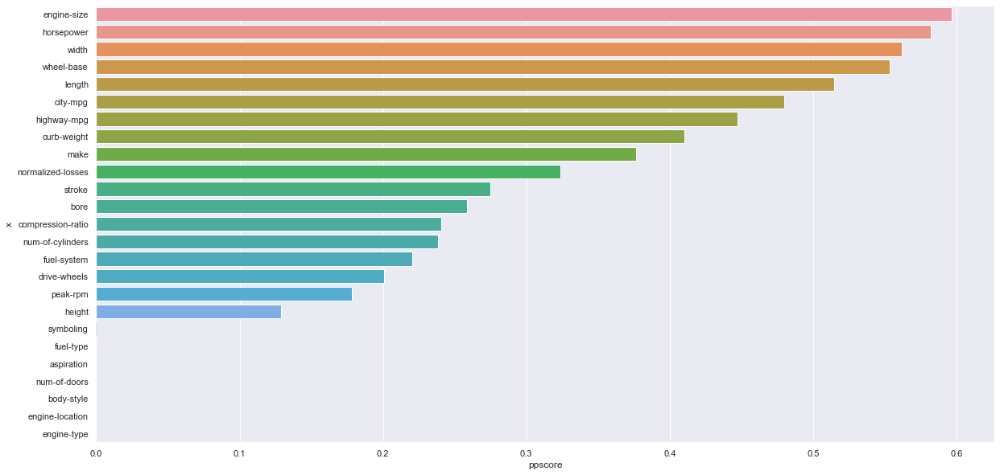

In [12]:
## Predictive Power Score — Feature Importance (generates a Predictive Power Score Plot of how likely other features in the datset can predict the target feature)

eda_numcat(df, x="price", method="pps")

Scatterplot of wheel-base versus price


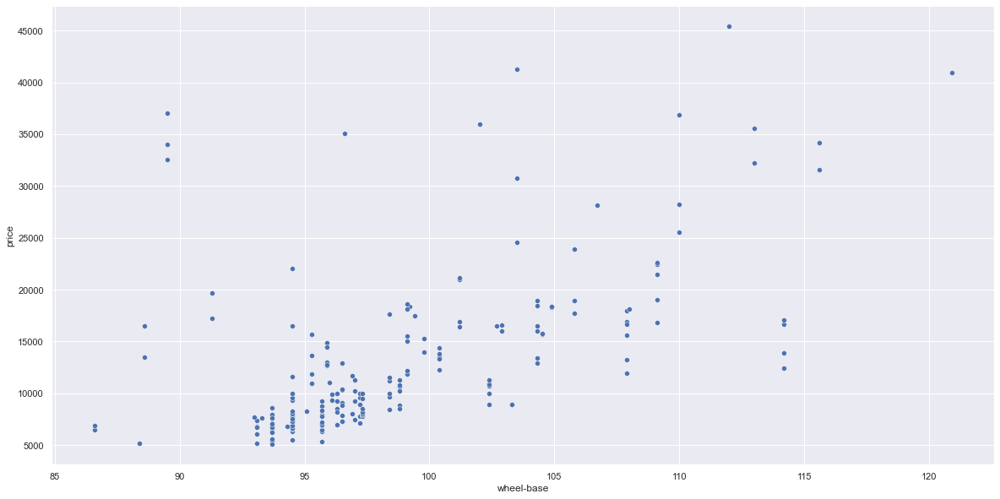

In [13]:
## Scatterplots (hue takes in a categorical column name)

eda_numcat(df, x="wheel-base", y="price", method="relationship", hue=None)

Violinplot of numerical feature price across categorical feature price


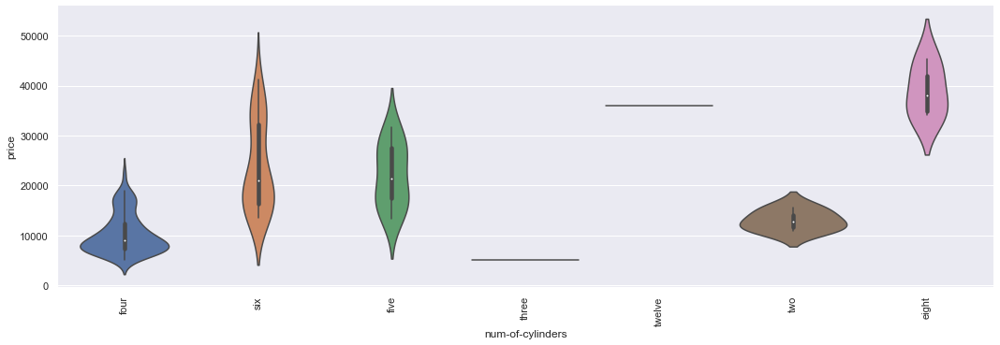

In [14]:
## Violinplots
## (A violin plot is a method of plotting data similar to a boxplot, with the addition of a rotated kernel 
## density plot on each side, which basically shows the distribution of numeric column across each category 
## from our categoric column)

eda_numcat(df, x="num-of-cylinders", y="price", method="comparison")

In [15]:
## Pivot Views (create a pivot table)

eda_numcat(df, x=["body-style"], y=None, values=["horsepower", "price"], 
           aggfunc="mean", method="pivot")

Pivot View


,horsepower,price
body-style,,
convertible,131.67,21890.50
hardtop,142.25,22208.50
hatchback,101.33,9957.44
sedan,103.10,14459.76
wagon,97.75,12371.96


Given a DataFrame data and columns x & y, it generates a pivot table of the columns specified in x across columns specified in y. hue takes in a categorical column name. Columns can be given either as string or list values.

- If **values** is not given, the plot shows pivot tables aggregates data across all numeric columns. It can take a list or string of column name(s) as value
- If **aggfunc** is not given, the plot aggregates the pivot table by mean. It can take either of these 6 values : min, max, mean, median, sum and count